<a id="I"></a>

# I.  Reading Data - Exploratory Data Analysis with Pandas

In [73]:
# Soufiane MOUHTARAM M.Sid ABDELLAH regagde
# Importing the libraries
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import confusion_matrix
from sklearn.metrics import accuracy_score
import seaborn as sns
sns.set()  #  Will import Seaborn functionalities
# we don't like warnings
# you can comment the following 2 lines if you'd like to
import warnings
warnings.filterwarnings('ignore')
%matplotlib inline



We’ll demonstrate the main methods in action by analyzing a [dataset](https://bigml.com/user/francisco/gallery/dataset/5163ad540c0b5e5b22000383) on the churn rate of telecom operator clients. Let’s read the data (using `read_csv`), and take a look at the first 5 lines using the `head` method:


In [74]:
# Soufiane MOUHTARAM M.Sid ABDELLAH regagde
# Disply all Columns
pd.options.display.max_columns=40

In [75]:
# Soufiane MOUHTARAM M.Sid ABDELLAH regagde
autinsurance = pd.read_csv('insurance_claims_complete.csv')
autinsurance.head(5)

,months_as_customer,age,policy_number,policy_bind_date,policy_state,policy_csl,policy_deductable,policy_annual_premium,umbrella_limit,insured_zip,insured_sex,insured_education_level,insured_occupation,insured_hobbies,insured_relationship,capital-gains,capital-loss,incident_date,incident_type,collision_type,incident_severity,authorities_contacted,incident_state,incident_city,incident_location,incident_hour_of_the_day,number_of_vehicles_involved,property_damage,bodily_injuries,witnesses,police_report_available,total_claim_amount,injury_claim,property_claim,vehicle_claim,auto_make,auto_model,auto_year,fraud_reported
0,328.0,48.0,521585.0,10/17/2014,OH,250/500,1000.0,1406.91,0.0,466132.0,MALE,MD,craft-repair,sleeping,husband,53300.0,0.0,1/25/2015,Single Vehicle Collision,Side Collision,Major Damage,Police,SC,Columbus,9935 4th Drive,5.0,1.0,YES,1.0,2.0,YES,71610.0,6510.0,13020.0,52080.0,Saab,92x,2004.0,1.0
1,228.0,42.0,342868.0,6/27/2006,IN,250/500,2000.0,1197.22,5000000.0,468176.0,MALE,MD,machine-op-inspct,reading,other-relative,0.0,0.0,1/21/2015,Vehicle Theft,?,Minor Damage,Police,VA,Riverwood,6608 MLK Hwy,8.0,1.0,?,0.0,0.0,?,5070.0,780.0,780.0,3510.0,Mercedes,E400,2007.0,1.0
2,134.0,29.0,687698.0,9/6/2000,OH,100/300,2000.0,1413.14,5000000.0,430632.0,FEMALE,PhD,sales,board-games,own-child,35100.0,0.0,2/22/2015,Multi-vehicle Collision,Rear Collision,Minor Damage,Police,NY,Columbus,7121 Francis Lane,7.0,3.0,NO,2.0,3.0,NO,34650.0,7700.0,3850.0,23100.0,Dodge,RAM,2007.0,0.0
3,256.0,41.0,227811.0,5/25/1990,IL,250/500,2000.0,1415.74,6000000.0,608117.0,FEMALE,PhD,armed-forces,board-games,unmarried,48900.0,-62400.0,1/10/2015,Single Vehicle Collision,Front Collision,Major Damage,Police,OH,Arlington,6956 Maple Drive,5.0,1.0,?,1.0,2.0,NO,63400.0,6340.0,6340.0,50720.0,Chevrolet,Tahoe,2014.0,1.0
4,228.0,44.0,367455.0,6/6/2014,IL,500/1000,1000.0,1583.91,6000000.0,610706.0,MALE,Associate,sales,board-games,unmarried,66000.0,-46000.0,2/17/2015,Vehicle Theft,?,Minor Damage,None,NY,Arlington,3041 3rd Ave,20.0,1.0,NO,0.0,1.0,NO,6500.0,1300.0,650.0,4550.0,Accura,RSX,2009.0,0.0


In [76]:
# Soufiane MOUHTARAM M.Sid ABDELLAH regagde

autinsurance.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1000 entries, 0 to 999
Data columns (total 39 columns):
 #   Column                       Non-Null Count  Dtype  
---  ------                       --------------  -----  
 0   months_as_customer           548 non-null    float64
 1   age                          548 non-null    float64
 2   policy_number                548 non-null    float64
 3   policy_bind_date             548 non-null    object 
 4   policy_state                 548 non-null    object 
 5   policy_csl                   548 non-null    object 
 6   policy_deductable            548 non-null    float64
 7   policy_annual_premium        548 non-null    float64
 8   umbrella_limit               548 non-null    float64
 9   insured_zip                  548 non-null    float64
 10  insured_sex                  548 non-null    object 
 11  insured_education_level      548 non-null    object 
 12  insured_occupation           548 non-null    object 
 13  insured_hobbies    

In [77]:
# Soufiane MOUHTARAM M.Sid ABDELLAH regagde
autinsurance.isna().sum()  ## Count Filled cells
                             ## Sum empty cells

months_as_customer             452
age                            452
policy_number                  452
policy_bind_date               452
policy_state                   452
policy_csl                     452
policy_deductable              452
policy_annual_premium          452
umbrella_limit                 452
insured_zip                    452
insured_sex                    452
insured_education_level        452
insured_occupation             452
insured_hobbies                452
insured_relationship           452
capital-gains                  452
capital-loss                   452
incident_date                  452
incident_type                  452
collision_type                 452
incident_severity              452
authorities_contacted          452
incident_state                 452
incident_city                  452
incident_location              452
incident_hour_of_the_day       452
number_of_vehicles_involved    452
property_damage                452
bodily_injuries     

In [78]:
# Soufiane MOUHTARAM M.Sid ABDELLAH regagde

# Column names may be accessed (and changed) using the `.columns` attribute as below
print("Old Column Names:\n", autinsurance.columns) 

Old Column Names:
 Index(['months_as_customer', 'age', 'policy_number', 'policy_bind_date',
       'policy_state', 'policy_csl', 'policy_deductable',
       'policy_annual_premium', 'umbrella_limit', 'insured_zip', 'insured_sex',
       'insured_education_level', 'insured_occupation', 'insured_hobbies',
       'insured_relationship', 'capital-gains', 'capital-loss',
       'incident_date', 'incident_type', 'collision_type', 'incident_severity',
       'authorities_contacted', 'incident_state', 'incident_city',
       'incident_location', 'incident_hour_of_the_day',
       'number_of_vehicles_involved', 'property_damage', 'bodily_injuries',
       'witnesses', 'police_report_available', 'total_claim_amount',
       'injury_claim', 'property_claim', 'vehicle_claim', 'auto_make',
       'auto_model', 'auto_year', 'fraud_reported'],
      dtype='object')


In [79]:
# !pip install pyjanitor 
import janitor
autinsurance = autinsurance.clean_names()
print("New Janitor Column Names:\n", autinsurance.columns) 

New Janitor Column Names:
 Index(['months_as_customer', 'age', 'policy_number', 'policy_bind_date',
       'policy_state', 'policy_csl', 'policy_deductable',
       'policy_annual_premium', 'umbrella_limit', 'insured_zip', 'insured_sex',
       'insured_education_level', 'insured_occupation', 'insured_hobbies',
       'insured_relationship', 'capital_gains', 'capital_loss',
       'incident_date', 'incident_type', 'collision_type', 'incident_severity',
       'authorities_contacted', 'incident_state', 'incident_city',
       'incident_location', 'incident_hour_of_the_day',
       'number_of_vehicles_involved', 'property_damage', 'bodily_injuries',
       'witnesses', 'police_report_available', 'total_claim_amount',
       'injury_claim', 'property_claim', 'vehicle_claim', 'auto_make',
       'auto_model', 'auto_year', 'fraud_reported'],
      dtype='object')


In [80]:
autinsurance.shape

(1000, 39)

In [81]:
print(autinsurance.columns)

Index(['months_as_customer', 'age', 'policy_number', 'policy_bind_date',
       'policy_state', 'policy_csl', 'policy_deductable',
       'policy_annual_premium', 'umbrella_limit', 'insured_zip', 'insured_sex',
       'insured_education_level', 'insured_occupation', 'insured_hobbies',
       'insured_relationship', 'capital_gains', 'capital_loss',
       'incident_date', 'incident_type', 'collision_type', 'incident_severity',
       'authorities_contacted', 'incident_state', 'incident_city',
       'incident_location', 'incident_hour_of_the_day',
       'number_of_vehicles_involved', 'property_damage', 'bodily_injuries',
       'witnesses', 'police_report_available', 'total_claim_amount',
       'injury_claim', 'property_claim', 'vehicle_claim', 'auto_make',
       'auto_model', 'auto_year', 'fraud_reported'],
      dtype='object')


In [82]:
autinsurance.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1000 entries, 0 to 999
Data columns (total 39 columns):
 #   Column                       Non-Null Count  Dtype  
---  ------                       --------------  -----  
 0   months_as_customer           548 non-null    float64
 1   age                          548 non-null    float64
 2   policy_number                548 non-null    float64
 3   policy_bind_date             548 non-null    object 
 4   policy_state                 548 non-null    object 
 5   policy_csl                   548 non-null    object 
 6   policy_deductable            548 non-null    float64
 7   policy_annual_premium        548 non-null    float64
 8   umbrella_limit               548 non-null    float64
 9   insured_zip                  548 non-null    float64
 10  insured_sex                  548 non-null    object 
 11  insured_education_level      548 non-null    object 
 12  insured_occupation           548 non-null    object 
 13  insured_hobbies    

In [83]:
autinsurance.describe() # help us to describe dataframe and give us the statistical values

,months_as_customer,age,policy_number,policy_deductable,policy_annual_premium,umbrella_limit,insured_zip,capital_gains,capital_loss,incident_hour_of_the_day,number_of_vehicles_involved,bodily_injuries,witnesses,total_claim_amount,injury_claim,property_claim,vehicle_claim,auto_year,fraud_reported
count,548.000000,548.000000,548.000000,548.000000,548.000000,5.480000e+02,548.000000,548.000000,548.000000,548.000000,548.000000,548.000000,548.000000,548.000000,548.000000,548.000000,548.000000,548.000000,548.000000
mean,203.883212,38.879562,532436.461679,1197.080292,1251.040055,1.180657e+06,499843.768248,24827.372263,-26224.087591,11.720803,1.844891,0.987226,1.434307,53759.872263,7623.083942,7570.912409,38565.875912,2005.527372,0.257299
std,116.350904,9.188266,257962.500112,621.396858,240.778225,2.394049e+06,71048.084681,28016.929767,27823.443814,6.761311,1.018849,0.810027,1.098973,26877.413347,4953.829772,4980.572888,19094.040873,5.994603,0.437545
min,0.000000,19.000000,104594.000000,500.000000,433.330000,-1.000000e+06,430104.000000,0.000000,-91400.000000,0.000000,1.000000,0.000000,0.000000,2160.000000,0.000000,0.000000,1440.000000,1995.000000,0.000000
25%,112.000000,31.000000,330569.750000,500.000000,1086.412500,0.000000e+00,448757.500000,0.000000,-51125.000000,6.000000,1.000000,0.000000,0.000000,42922.500000,4570.000000,4640.000000,31497.500000,2001.000000,0.000000
50%,206.500000,39.000000,512956.000000,1000.000000,1255.650000,0.000000e+00,466196.000000,0.000000,-21500.000000,12.000000,1.000000,1.000000,1.000000,59685.000000,6935.000000,6715.000000,43370.000000,2006.000000,0.000000
75%,279.000000,45.000000,746803.000000,2000.000000,1402.757500,0.000000e+00,602409.750000,51025.000000,0.000000,17.000000,3.000000,2.000000,2.000000,72105.000000,11585.000000,11350.000000,51427.500000,2011.000000,1.000000
max,479.000000,64.000000,999435.000000,2000.000000,2047.590000,1.000000e+07,620869.000000,98800.000000,0.000000,23.000000,4.000000,2.000000,3.000000,114920.000000,21450.000000,23670.000000,79560.000000,2015.000000,1.000000


In order to see statistics on non-numerical features, one has to explicitly indicate data types of interest in the `include` parameter.

In [84]:
autinsurance.describe(include=['object', 'bool'])

,policy_bind_date,policy_state,policy_csl,insured_sex,insured_education_level,insured_occupation,insured_hobbies,insured_relationship,incident_date,incident_type,collision_type,incident_severity,authorities_contacted,incident_state,incident_city,incident_location,property_damage,police_report_available,auto_make,auto_model
count,548,548,548,548,548,548,548,548,548,548,548,548,548,548,548,548,548,548,548,548
unique,532,3,3,2,7,14,20,6,60,4,4,4,5,7,7,548,3,3,14,39
top,1/1/2006,IL,100/300,FEMALE,High School,machine-op-inspct,reading,other-relative,1/7/2015,Multi-vehicle Collision,Rear Collision,Minor Damage,Police,NY,Springfield,9935 4th Drive,?,NO,Suburu,A3
freq,3,198,203,299,85,52,38,106,18,231,159,186,159,146,88,1,204,196,48,22


For categorical (type `object`) and boolean (type `bool`) features we can use the `value_counts` method. Let’s have a look at the distribution of `fraud_reported`:

In [85]:
autinsurance['fraud_reported'].value_counts()

0.0    407
1.0    141
Name: fraud_reported, dtype: int64

In [86]:
autinsurance['fraud_reported'].value_counts(normalize=True)

0.0    0.742701
1.0    0.257299
Name: fraud_reported, dtype: float64

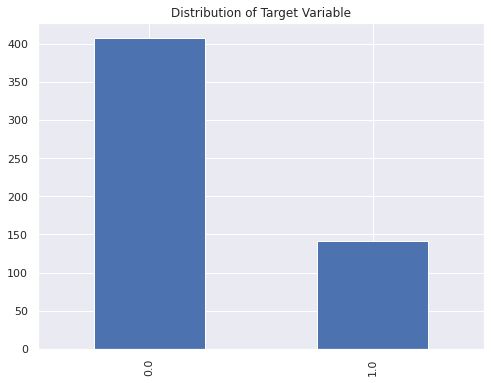

In [87]:
(autinsurance['fraud_reported'].value_counts().plot(
        kind='bar',
        figsize=(8, 6),
        title='Distribution of Target Variable',
    )
);
plt.show()

In [88]:
autinsurance['fraud_reported'].mean()

0.2572992700729927

In [89]:
autinsurance.columns

Index(['months_as_customer', 'age', 'policy_number', 'policy_bind_date',
       'policy_state', 'policy_csl', 'policy_deductable',
       'policy_annual_premium', 'umbrella_limit', 'insured_zip', 'insured_sex',
       'insured_education_level', 'insured_occupation', 'insured_hobbies',
       'insured_relationship', 'capital_gains', 'capital_loss',
       'incident_date', 'incident_type', 'collision_type', 'incident_severity',
       'authorities_contacted', 'incident_state', 'incident_city',
       'incident_location', 'incident_hour_of_the_day',
       'number_of_vehicles_involved', 'property_damage', 'bodily_injuries',
       'witnesses', 'police_report_available', 'total_claim_amount',
       'injury_claim', 'property_claim', 'vehicle_claim', 'auto_make',
       'auto_model', 'auto_year', 'fraud_reported'],
      dtype='object')

<a id="II"></a>
# II. Visual data analysis in Python


### Article outline

1. Dataset
2. Univariate visualization
    * 2.1 Quantitative features
    * 2.2 Categorical and binary features
3. Multivariate visualization
    * 3.1 Quantitative–Quantitative
    * 3.2 Quantitative–Categorical
    * 3.3 Categorical–Categorical
4. Whole dataset
    * 4.1 Naive approach
    * 4.2 Dimensionality reduction
    * 4.2 t-SNE
5. Useful resources

### 1. Univariate visualization

*Univariate* analysis looks at one feature at a time. When we analyze a feature independently, we are usually mostly interested in the *distribution of its values* and ignore other features in the dataset.

Below, we will consider different statistical types of features and the corresponding tools for their individual visual analysis.

#### 1.1 Quantitative features

*Quantitative features* take on ordered numerical values. Those values can be *discrete*, like integers, or *continuous*, like real numbers, and usually express a count or a measurement.

##### 1.1.1 Histograms and density plots

The easiest way to take a look at the distribution of a numerical variable is to plot its *histogram* using the `DataFrame`'s method [`hist()`](https://pandas.pydata.org/pandas-docs/stable/generated/pandas.DataFrame.hist.html).

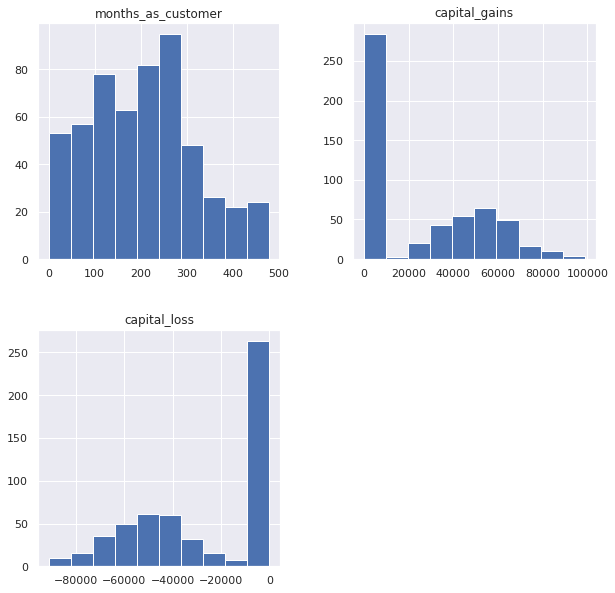

In [90]:
features = ['months_as_customer', 'capital_gains', 'capital_loss']

autinsurance[features].hist(figsize=(10, 10));

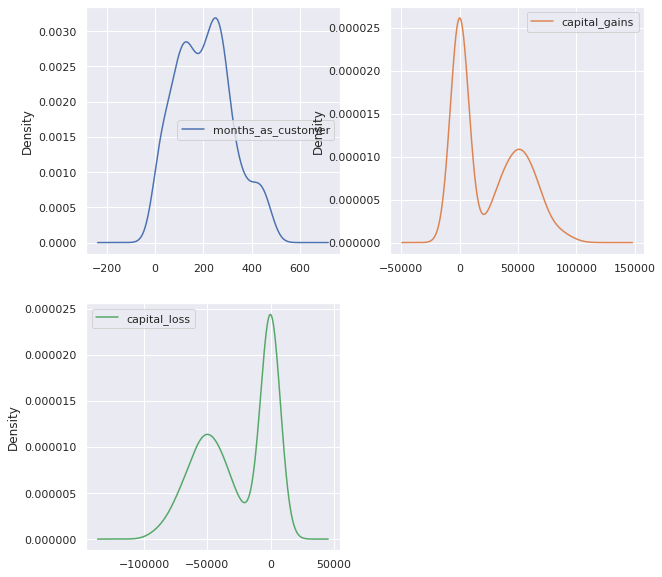

In [91]:
autinsurance[features].plot(kind='density', subplots=True, layout=(2, 2), 
                  sharex=False, figsize=(10, 10));

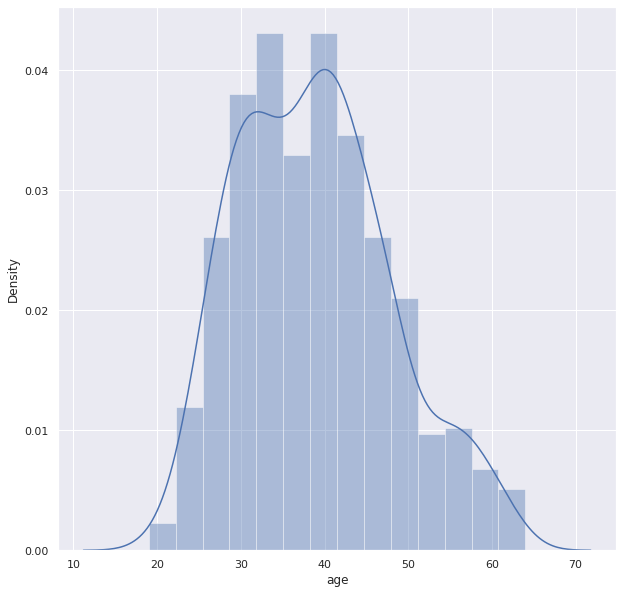

In [92]:
# increasing the width of the Chart
import seaborn as sns
plt.rcParams['figure.figsize'] = 10,10 # similar to par(mfrow = c(2,1), mar = c(4,4,2,1)) # 2 columns and 1 row
sns.distplot(autinsurance["age"]) # pass it one variable
# if you are getting warnings related to the package you should use ignore function
import warnings
warnings.filterwarnings ('ignore')

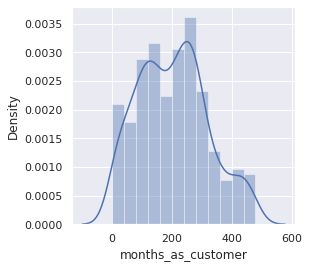

In [93]:
# increasing the width of the Chart
plt.rcParams['figure.figsize'] = 4,4 # similar to par(mfrow = c(2,1), mar = c(4,4,2,1)) # 2 columns and 1 row
sns.distplot(autinsurance["months_as_customer"]) # pass it one variable

# if you are getting warnings related to the package you should use ignore function
import warnings
warnings.filterwarnings ('ignore')

#### 1.2 Categorical and binary features

*Categorical features* take on a fixed number of values. Each of these values assigns an observation to a corresponding group, known as a *category*, which reflects some qualitative property of this example. *Binary* variables are an important special case of categorical variables when the number of possible values is exactly 2. If the values of a categorical variable are ordered, it is called *ordinal*.

##### 1.2.1 Frequency table

Let’s check the class balance in our dataset by looking at the distribution of the target variable: the *churn rate*. First, we will get a frequency table, which shows how frequent each value of the categorical variable is. For this, we will use the [`value_counts()`](https://pandas.pydata.org/pandas-docs/stable/generated/pandas.Series.value_counts.html) method:

In [94]:
autinsurance['fraud_reported'].value_counts()

0.0    407
1.0    141
Name: fraud_reported, dtype: int64

By default, the entries in the output are sorted from the most to the least frequently-occurring values.

In our case, the data is not *balanced*; that is, our two target classes, loyal and disloyal customers, are not represented equally in the dataset. Only a small part of the clients canceled their subscription to the telecom service. As we will see in the following articles, this fact may imply some restrictions on measuring the classification performance, and, in the future, we may want to additionaly penalize our model errors in predicting the minority "Churn" class.

##### 1.2.2 Bar plot

The bar plot is a graphical representation of the frequency table. The easiest way to create it is to use the `seaborn`'s function [`countplot()`](https://seaborn.pydata.org/generated/seaborn.countplot.html). There is another function in `seaborn` that is somewhat confusingly called [`barplot()`](https://seaborn.pydata.org/generated/seaborn.barplot.html) and is mostly used for representation of some basic statistics of a numerical variable grouped by a categorical feature.

Let's plot the distributions for two categorical variables:

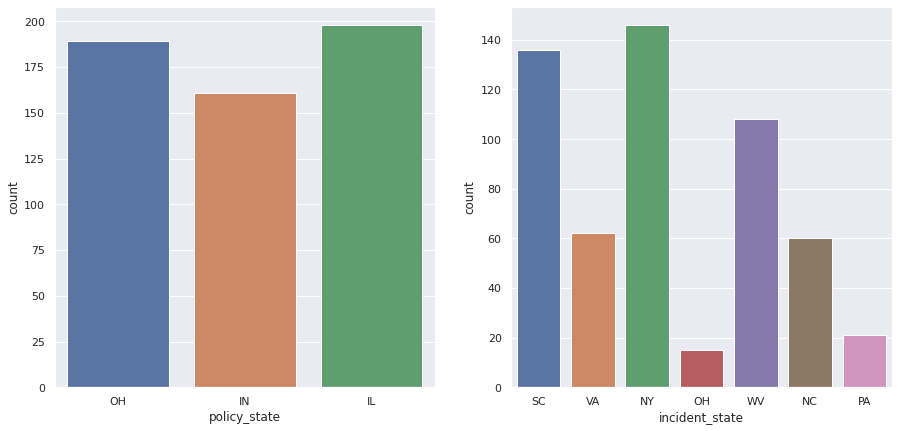

In [95]:
_, axes = plt.subplots(nrows=1, ncols=2, figsize=(15, 7))

sns.countplot(x='policy_state', data=autinsurance, ax=axes[0]);
sns.countplot(x='incident_state', data=autinsurance, ax=axes[1]);

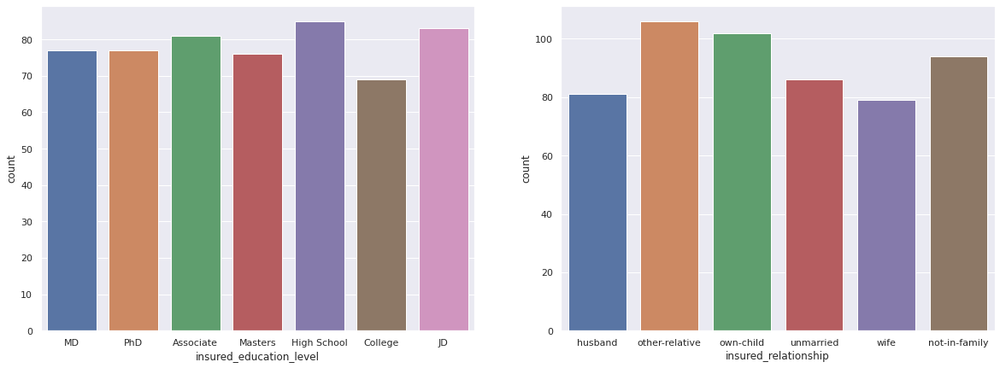

In [96]:
_, axes = plt.subplots(nrows=1, ncols=2, figsize=(20, 7))

sns.countplot(x='insured_education_level', data=autinsurance, ax=axes[0]);
sns.countplot(x='insured_relationship', data=autinsurance, ax=axes[1]);

#### 1.2.3. Distributions of categorical features

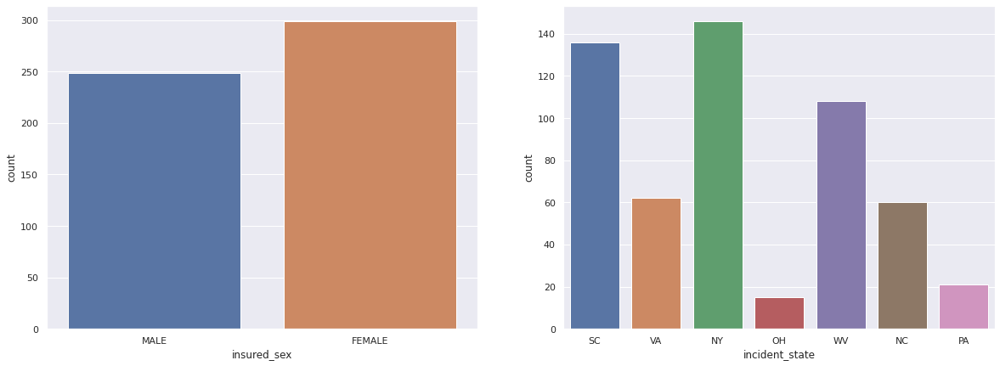

In [97]:
_, axes = plt.subplots(nrows=1, ncols=2, figsize=(20, 7))

sns.countplot(x='insured_sex', data=autinsurance, ax=axes[0]);
sns.countplot(x='incident_state', data=autinsurance, ax=axes[1]);

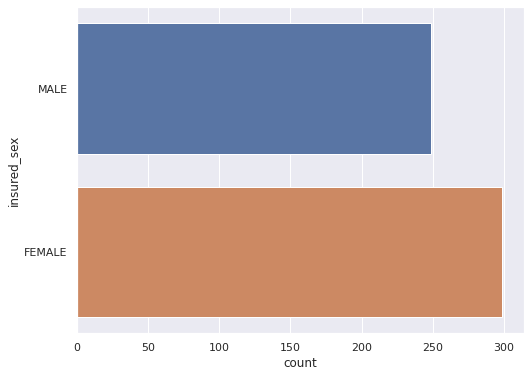

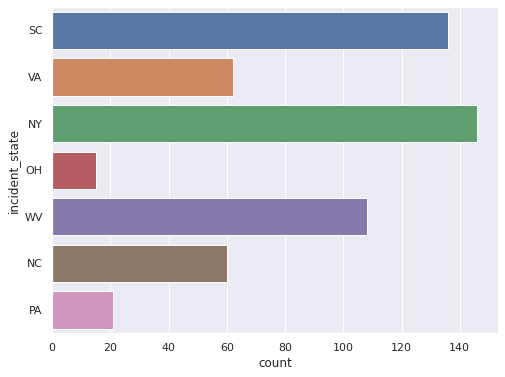

In [98]:
# Distributions of categorical features
plt.rcParams['figure.figsize'] = 8,6
sns.countplot(y='insured_sex', data=autinsurance)
plt.show()

sns.countplot(y='incident_state', data=autinsurance)
plt.show()

### 2. Multivariate visualization

*Multivariate* plots allow us to see relationships between two and more different variables, all in one figure. Just as in the case of univariate plots, the specific type of visualization will depend on the types of the variables being analyzed.

#### 2.1 Quantitative–Quantitative

##### 2.1.1 Correlation matrix


In [99]:
autinsurance.head(5)

,months_as_customer,age,policy_number,policy_bind_date,policy_state,policy_csl,policy_deductable,policy_annual_premium,umbrella_limit,insured_zip,insured_sex,insured_education_level,insured_occupation,insured_hobbies,insured_relationship,capital_gains,capital_loss,incident_date,incident_type,collision_type,incident_severity,authorities_contacted,incident_state,incident_city,incident_location,incident_hour_of_the_day,number_of_vehicles_involved,property_damage,bodily_injuries,witnesses,police_report_available,total_claim_amount,injury_claim,property_claim,vehicle_claim,auto_make,auto_model,auto_year,fraud_reported
0,328.0,48.0,521585.0,10/17/2014,OH,250/500,1000.0,1406.91,0.0,466132.0,MALE,MD,craft-repair,sleeping,husband,53300.0,0.0,1/25/2015,Single Vehicle Collision,Side Collision,Major Damage,Police,SC,Columbus,9935 4th Drive,5.0,1.0,YES,1.0,2.0,YES,71610.0,6510.0,13020.0,52080.0,Saab,92x,2004.0,1.0
1,228.0,42.0,342868.0,6/27/2006,IN,250/500,2000.0,1197.22,5000000.0,468176.0,MALE,MD,machine-op-inspct,reading,other-relative,0.0,0.0,1/21/2015,Vehicle Theft,?,Minor Damage,Police,VA,Riverwood,6608 MLK Hwy,8.0,1.0,?,0.0,0.0,?,5070.0,780.0,780.0,3510.0,Mercedes,E400,2007.0,1.0
2,134.0,29.0,687698.0,9/6/2000,OH,100/300,2000.0,1413.14,5000000.0,430632.0,FEMALE,PhD,sales,board-games,own-child,35100.0,0.0,2/22/2015,Multi-vehicle Collision,Rear Collision,Minor Damage,Police,NY,Columbus,7121 Francis Lane,7.0,3.0,NO,2.0,3.0,NO,34650.0,7700.0,3850.0,23100.0,Dodge,RAM,2007.0,0.0
3,256.0,41.0,227811.0,5/25/1990,IL,250/500,2000.0,1415.74,6000000.0,608117.0,FEMALE,PhD,armed-forces,board-games,unmarried,48900.0,-62400.0,1/10/2015,Single Vehicle Collision,Front Collision,Major Damage,Police,OH,Arlington,6956 Maple Drive,5.0,1.0,?,1.0,2.0,NO,63400.0,6340.0,6340.0,50720.0,Chevrolet,Tahoe,2014.0,1.0
4,228.0,44.0,367455.0,6/6/2014,IL,500/1000,1000.0,1583.91,6000000.0,610706.0,MALE,Associate,sales,board-games,unmarried,66000.0,-46000.0,2/17/2015,Vehicle Theft,?,Minor Damage,None,NY,Arlington,3041 3rd Ave,20.0,1.0,NO,0.0,1.0,NO,6500.0,1300.0,650.0,4550.0,Accura,RSX,2009.0,0.0


In [100]:
corr_matrix = autinsurance.corr(method = 'pearson')  # corr(autinsurance)
corr_matrix

,months_as_customer,age,policy_number,policy_deductable,policy_annual_premium,umbrella_limit,insured_zip,capital_gains,capital_loss,incident_hour_of_the_day,number_of_vehicles_involved,bodily_injuries,witnesses,total_claim_amount,injury_claim,property_claim,vehicle_claim,auto_year,fraud_reported
months_as_customer,1.000000,0.923201,0.019023,0.013834,0.035078,0.012520,0.025102,-0.024322,0.071695,0.043980,0.023242,-0.016795,0.052997,0.035513,0.024348,0.005049,0.042355,-0.069200,0.010215
age,0.923201,1.000000,0.036340,0.014251,0.053206,0.016449,0.050345,-0.029955,0.052700,0.071113,0.054048,-0.025752,0.034519,0.048453,0.045127,0.017853,0.051839,-0.044482,-0.014105
policy_number,0.019023,0.036340,1.000000,0.005951,0.049011,-0.018558,0.024316,0.051990,-0.006420,0.063404,0.059154,-0.032602,0.007565,-0.047703,-0.011720,-0.013458,-0.060597,-0.026561,-0.045892
policy_deductable,0.013834,0.014251,0.005951,1.000000,-0.000265,0.003059,0.038858,0.086222,0.000989,0.041621,0.052704,0.006827,0.069857,0.006836,0.022604,0.063306,-0.012755,-0.010285,0.038405
policy_annual_premium,0.035078,0.053206,0.049011,-0.000265,1.000000,-0.040386,0.061658,0.000621,0.040850,0.010272,-0.018811,0.008773,0.000241,0.024097,0.013017,-0.012620,0.033834,0.025680,0.010318
umbrella_limit,0.012520,0.016449,-0.018558,0.003059,-0.040386,1.000000,0.034884,-0.021451,-0.041031,-0.009641,0.010010,0.066239,-0.027792,-0.014341,-0.027758,-0.006056,-0.011406,0.007107,0.039316
insured_zip,0.025102,0.050345,0.024316,0.038858,0.061658,0.034884,1.000000,0.005462,0.018446,0.031701,0.030358,0.042852,0.038066,-0.083737,-0.046451,-0.065134,-0.088830,-0.010776,0.016759
capital_gains,-0.024322,-0.029955,0.051990,0.086222,0.000621,-0.021451,0.005462,1.000000,-0.046322,-0.027663,0.078091,0.038472,-0.042442,0.017061,0.028046,-0.012551,0.020013,0.041556,-0.023094
capital_loss,0.071695,0.052700,-0.006420,0.000989,0.040850,-0.041031,0.018446,-0.046322,1.000000,-0.059752,-0.018421,-0.011459,-0.019196,-0.055801,-0.040479,-0.027624,-0.060840,-0.055426,0.001066
incident_hour_of_the_day,0.043980,0.071113,0.063404,0.041621,0.010272,-0.009641,0.031701,-0.027663,-0.059752,1.000000,0.157443,-0.023684,-0.006778,0.239587,0.212700,0.185505,0.233679,0.035168,-0.057861


<h4>Highly correlated items = not good!</h4>
<h4>Low correlated items = good </h4>
<h4>Correlations with target (dv) = good (high predictive power)</h4>

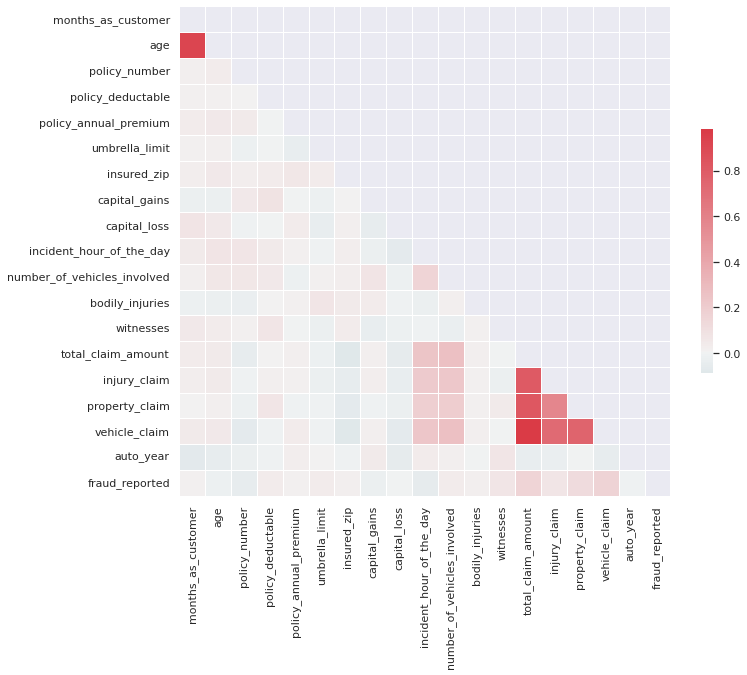

In [101]:
# seaborn
## first_twenty = har_train.iloc[:, :20] # pull out first 20 feats
corr = autinsurance.corr()  # compute correlation matrix
mask = np.zeros_like(corr, dtype=np.bool)  # make mask
mask[np.triu_indices_from(mask)] = True  # mask the upper triangle

fig, ax = plt.subplots(figsize=(11, 9))  # create a figure and a subplot
cmap = sns.diverging_palette(220, 10, as_cmap=True)  # custom color map
sns.heatmap(
    corr,
    mask=mask,
    cmap=cmap,
    center=0,
    linewidth=0.5,
    cbar_kws={'shrink': 0.5}
);

In [102]:
autinsurance

,months_as_customer,age,policy_number,policy_bind_date,policy_state,policy_csl,policy_deductable,policy_annual_premium,umbrella_limit,insured_zip,insured_sex,insured_education_level,insured_occupation,insured_hobbies,insured_relationship,capital_gains,capital_loss,incident_date,incident_type,collision_type,incident_severity,authorities_contacted,incident_state,incident_city,incident_location,incident_hour_of_the_day,number_of_vehicles_involved,property_damage,bodily_injuries,witnesses,police_report_available,total_claim_amount,injury_claim,property_claim,vehicle_claim,auto_make,auto_model,auto_year,fraud_reported
0,328.0,48.0,521585.0,10/17/2014,OH,250/500,1000.0,1406.91,0.0,466132.0,MALE,MD,craft-repair,sleeping,husband,53300.0,0.0,1/25/2015,Single Vehicle Collision,Side Collision,Major Damage,Police,SC,Columbus,9935 4th Drive,5.0,1.0,YES,1.0,2.0,YES,71610.0,6510.0,13020.0,52080.0,Saab,92x,2004.0,1.0
1,228.0,42.0,342868.0,6/27/2006,IN,250/500,2000.0,1197.22,5000000.0,468176.0,MALE,MD,machine-op-inspct,reading,other-relative,0.0,0.0,1/21/2015,Vehicle Theft,?,Minor Damage,Police,VA,Riverwood,6608 MLK Hwy,8.0,1.0,?,0.0,0.0,?,5070.0,780.0,780.0,3510.0,Mercedes,E400,2007.0,1.0
2,134.0,29.0,687698.0,9/6/2000,OH,100/300,2000.0,1413.14,5000000.0,430632.0,FEMALE,PhD,sales,board-games,own-child,35100.0,0.0,2/22/2015,Multi-vehicle Collision,Rear Collision,Minor Damage,Police,NY,Columbus,7121 Francis Lane,7.0,3.0,NO,2.0,3.0,NO,34650.0,7700.0,3850.0,23100.0,Dodge,RAM,2007.0,0.0
3,256.0,41.0,227811.0,5/25/1990,IL,250/500,2000.0,1415.74,6000000.0,608117.0,FEMALE,PhD,armed-forces,board-games,unmarried,48900.0,-62400.0,1/10/2015,Single Vehicle Collision,Front Collision,Major Damage,Police,OH,Arlington,6956 Maple Drive,5.0,1.0,?,1.0,2.0,NO,63400.0,6340.0,6340.0,50720.0,Chevrolet,Tahoe,2014.0,1.0
4,228.0,44.0,367455.0,6/6/2014,IL,500/1000,1000.0,1583.91,6000000.0,610706.0,MALE,Associate,sales,board-games,unmarried,66000.0,-46000.0,2/17/2015,Vehicle Theft,?,Minor Damage,None,NY,Arlington,3041 3rd Ave,20.0,1.0,NO,0.0,1.0,NO,6500.0,1300.0,650.0,4550.0,Accura,RSX,2009.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
995,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
996,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
997,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
998,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


##### How to calculate correlation between all columns and remove highly correlated ones using pandas?

In [103]:
import numpy as np

# Create correlation matrix
corr_matrix = autinsurance.corr().abs()

# Select upper triangle of correlation matrix
upper = corr_matrix.where(np.triu(np.ones(corr_matrix.shape), k=1).astype(np.bool))

# Find features with correlation greater than 0.95
to_drop = [column for column in upper.columns if any(upper[column] > 0.90)]

# Drop features 
autinsurance.drop(to_drop, axis=1, inplace=True)

autinsurance.shape

(1000, 37)

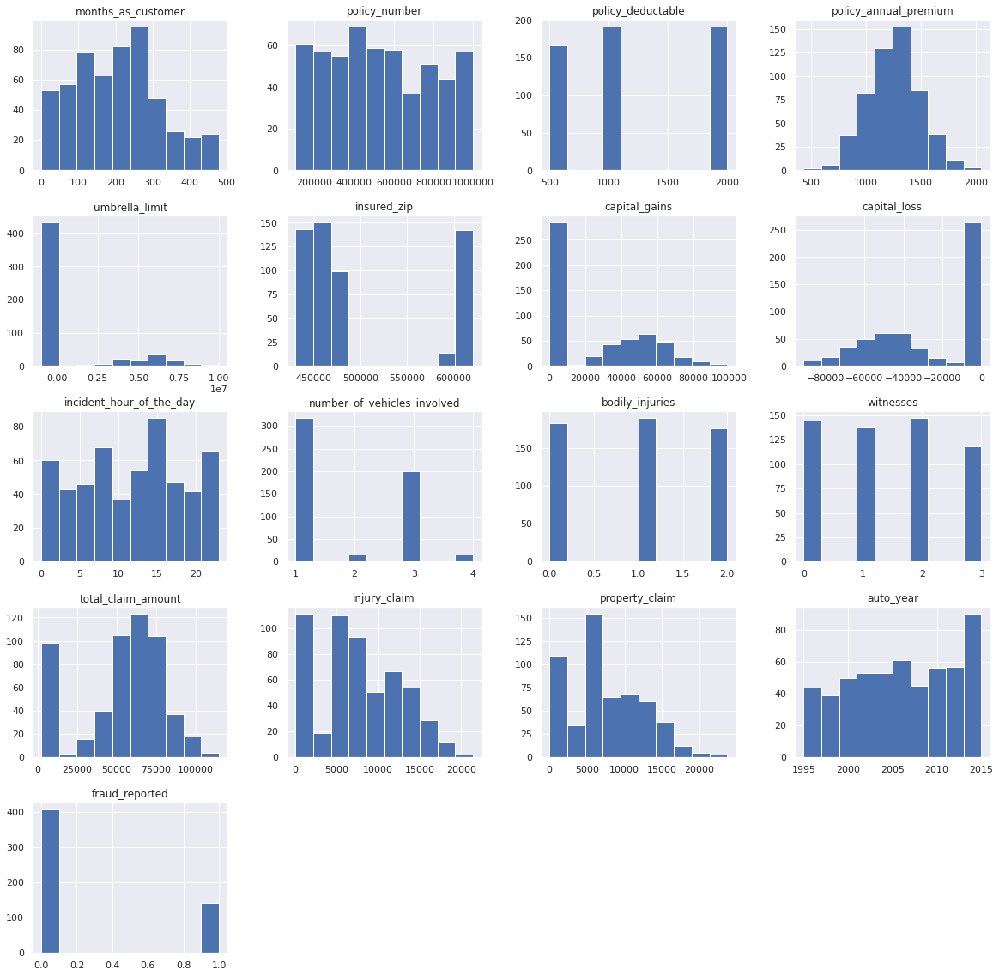

In [104]:
# Univariate Histograms
plt.rcParams['figure.figsize'] = 20,20  # control plot size

autinsurance.hist()
plt.show()


<a id="III"></a>
# III. Visual Data Analysis in with Profile Report


In [105]:
import pandas_profiling
autinsurance.profile_report()

Render HTML: 100%|██████████| 1/1 [00:06<00:00,  6.21s/it]


In [106]:
# Import Libraries
import sweetviz as sv
import pandas as pd

In [107]:
# Analyzing data
report=sv.analyze(autinsurance)

# Generating report
report.show_html('eda_report.html')

Done! Use 'show' commands to display/save.   |██████████| [100%]   00:03 -> (00:00 left)


Report eda_report.html was generated! NOTEBOOK/COLAB USERS: the web browser MAY not pop up, regardless, the report IS saved in your notebook/colab files.


#### Playing with Reports

In [108]:
report.show_html(filepath='eda_report.html',
open_browser=True,
layout='vertical',
scale=0.7)

Report eda_report.html was generated! NOTEBOOK/COLAB USERS: the web browser MAY not pop up, regardless, the report IS saved in your notebook/colab files.



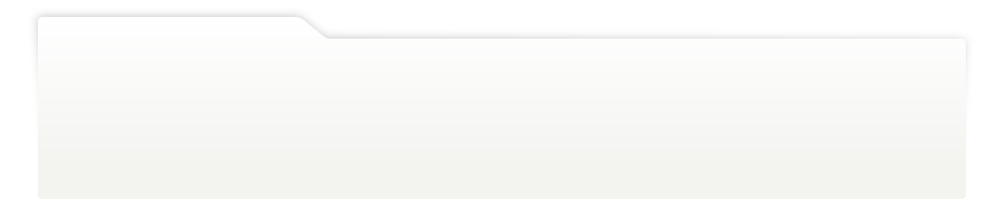
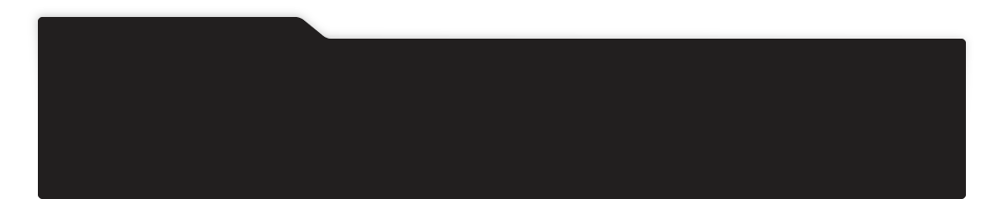
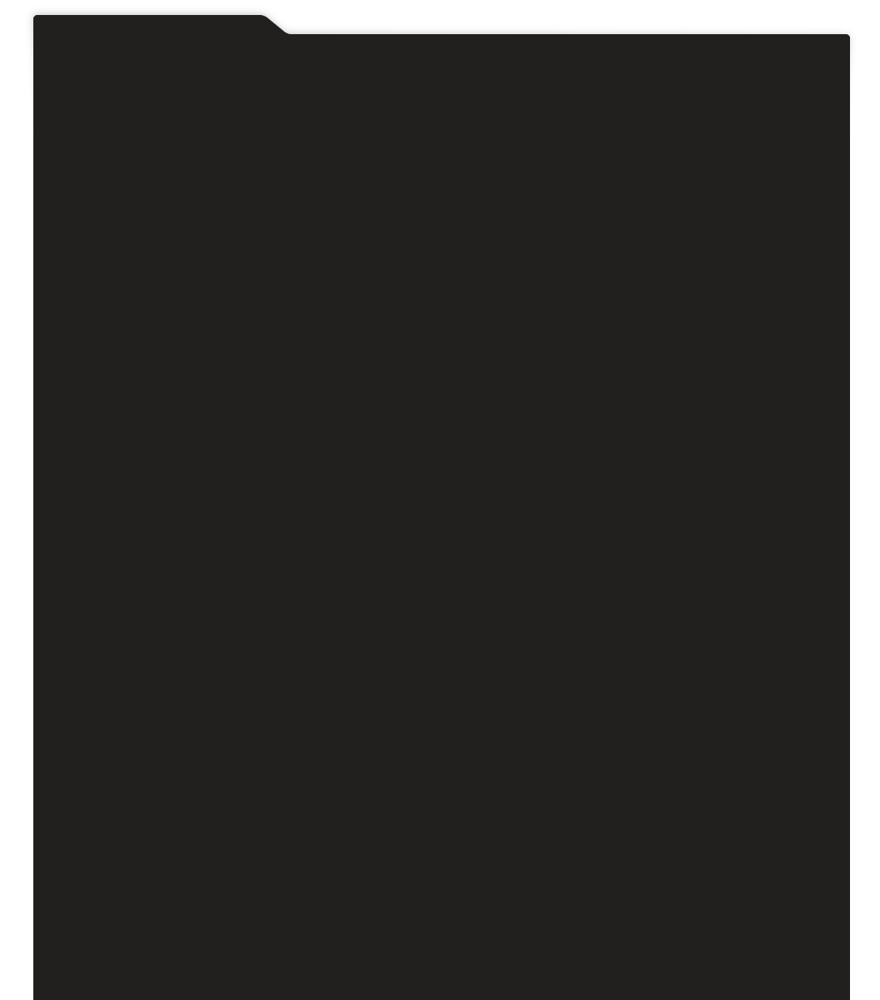
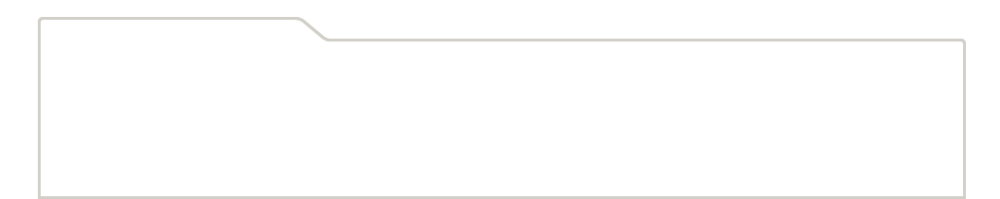
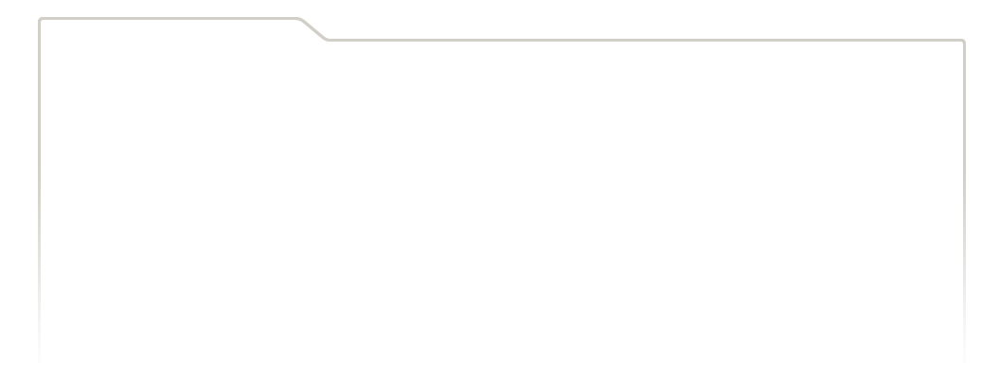
...
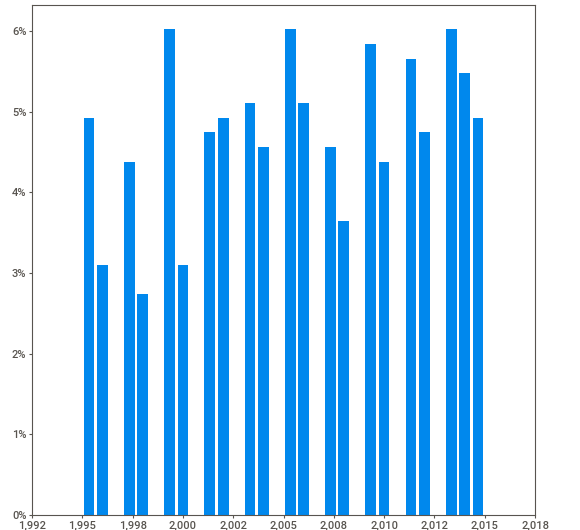
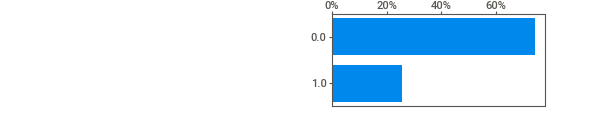
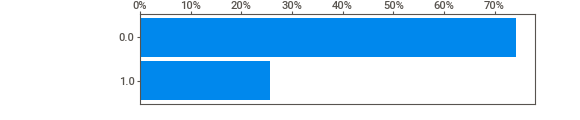
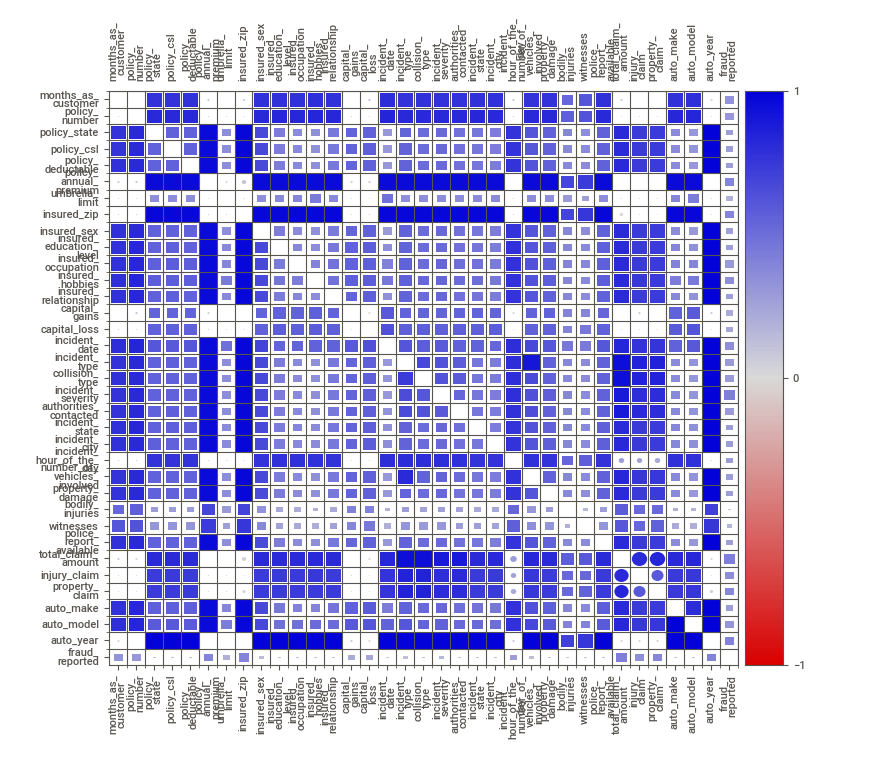
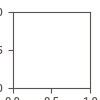

Report 'sweetviz_report.html' was saved to storage.


In [109]:
report.show_notebook(w=None, 
                h=None, 
                scale=None,
                layout='vertical',
                filepath='sweetviz_report.html')

In [110]:
autinsurance.columns

Index(['months_as_customer', 'policy_number', 'policy_bind_date',
       'policy_state', 'policy_csl', 'policy_deductable',
       'policy_annual_premium', 'umbrella_limit', 'insured_zip', 'insured_sex',
       'insured_education_level', 'insured_occupation', 'insured_hobbies',
       'insured_relationship', 'capital_gains', 'capital_loss',
       'incident_date', 'incident_type', 'collision_type', 'incident_severity',
       'authorities_contacted', 'incident_state', 'incident_city',
       'incident_location', 'incident_hour_of_the_day',
       'number_of_vehicles_involved', 'property_damage', 'bodily_injuries',
       'witnesses', 'police_report_available', 'total_claim_amount',
       'injury_claim', 'property_claim', 'auto_make', 'auto_model',
       'auto_year', 'fraud_reported'],
      dtype='object')

### Prior Knowledge for remove unuseful feautures

In [111]:
to_delete= [ 'policy_number', 'policy_bind_date', 'insured_zip', 'incident_date', 'incident_city',
            'incident_location', 'incident_hour_of_the_day', 'total_claim_amount','injury_claim', 
            'property_claim', 'auto_year' ]

In [112]:
autinsuranceV2 = autinsurance.drop(to_delete, axis = 1)

In [113]:
print(autinsurance.shape)
print(autinsuranceV2.shape)

(1000, 37)
(1000, 26)


Like you see after **Prior** **Knowledge** we lose 12 colmns

In [114]:
# Save to file
autinsuranceV2.to_csv("insurance_claimsV2.csv", index = False)


<a id="III"></a>
# III- Data Pre-processing &  Preparation

### Data Transformation

There are some algorithms that can work well with categorical data, such as decision trees. But most machine learning algorithms cannot operate directly with categorical data. These algorithms require the input and output both to be in numerical form. If the output to be predicted is categorical, then after prediction we convert them back to categorical data from numerical data. Let's discuss some key challenges that we face while dealing with categorical data:

####  Fixing Special Characters

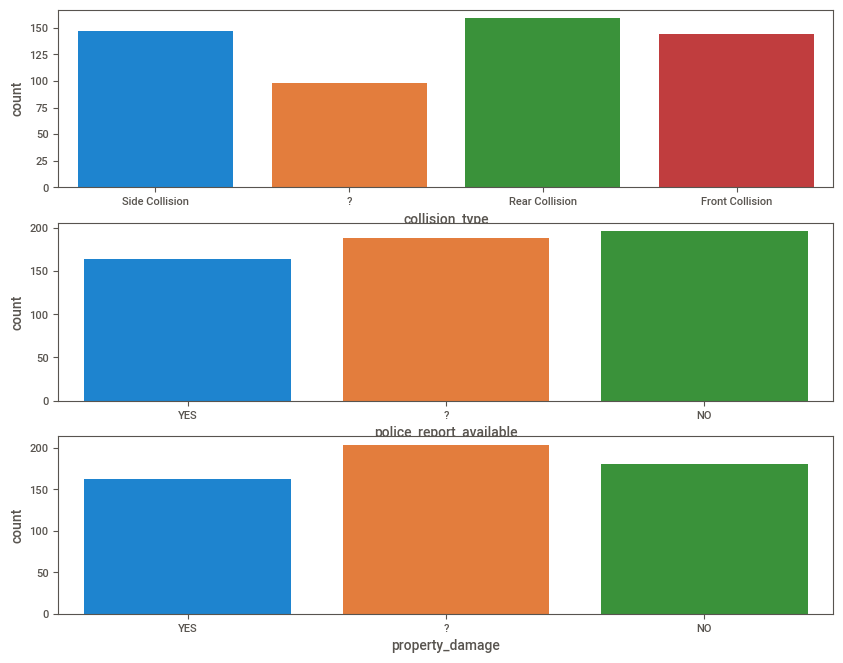

In [115]:
autinsurance_copy = autinsuranceV2.copy()

_, axes = plt.subplots(nrows=3, ncols=1, figsize=(10, 8))

sns.countplot(x='collision_type', data=autinsurance_copy, ax=axes[0]);

sns.countplot(x='police_report_available', data=autinsurance_copy, ax=axes[1]);

sns.countplot(x='property_damage', data=autinsurance_copy, ax=axes[2]);

###  2. Encoding Categorical Data!
#### Label Encoding

This is a technique in which we replace each value in a categorical column with numbers from 0 to N-1. For example, say we've got a list of employee names in a column. After performing label encoding, each employee name will be assigned a numeric label. But this might not be suitable for all cases because the model might consider numeric values to be weights assigned to the data. Label encoding is the **best method to use for ordinal data**. The scikit-learn library provides LabelEncoder(), which helps with label encoding. Let's look at an exercise in the next section.

Before doing the encoding, remove all the missing data. To do so, use the dropna() function, Select all the columns that are not numeric using the following code:

In [116]:
data_column_category = autinsurance_copy.select_dtypes(exclude=[np.number]).columns
data_column_category

Index(['policy_state', 'policy_csl', 'insured_sex', 'insured_education_level',
       'insured_occupation', 'insured_hobbies', 'insured_relationship',
       'incident_type', 'collision_type', 'incident_severity',
       'authorities_contacted', 'incident_state', 'property_damage',
       'police_report_available', 'auto_make', 'auto_model'],
      dtype='object')

```
data_column_category =[
    'policy_csl', 
    'insured_sex',
    'insured_education_level', 
    'insured_occupation', 
    'insured_hobbies',
    'insured_relationship', 
    'incident_type',
    'collision_type', 
    'incident_severity', 
    'authorities_contacted',
    'incident_state', 
    'property_damage', 
    'police_report_available', 
    'auto_make', 'auto_model']
```

In [117]:
data_column_category =[
    'policy_csl', 
    'insured_sex',
    'insured_education_level', 
    'insured_occupation', 
    'insured_hobbies',
    'insured_relationship', 
    'incident_type',
    'collision_type', 
    'incident_severity', 
    'authorities_contacted',
    'incident_state', 
    'property_damage', 
    'police_report_available', 
    'auto_make', 'auto_model']

In [118]:
#import the LabelEncoder class

from sklearn.preprocessing import LabelEncoder

#Creating the object instance

label_encoder = LabelEncoder()

for i in data_column_category:

    autinsurance_copy[i] = label_encoder.fit_transform(autinsurance_copy[i])

print("Label Encoded Data: ")

autinsurance_copy.head()

Label Encoded Data: 


,months_as_customer,policy_state,policy_csl,policy_deductable,policy_annual_premium,umbrella_limit,insured_sex,insured_education_level,insured_occupation,insured_hobbies,insured_relationship,capital_gains,capital_loss,incident_type,collision_type,incident_severity,authorities_contacted,incident_state,number_of_vehicles_involved,property_damage,bodily_injuries,witnesses,police_report_available,auto_make,auto_model,fraud_reported
0,328.0,OH,1,1000.0,1406.91,0.0,1,4,2,17,0,53300.0,0.0,2,3,0,4,4,1.0,2,1.0,2.0,2,10,1,1.0
1,228.0,IN,1,2000.0,1197.22,5000000.0,1,4,6,15,2,0.0,0.0,3,0,1,4,5,1.0,0,0.0,0.0,0,8,12,1.0
2,134.0,OH,0,2000.0,1413.14,5000000.0,0,6,11,2,3,35100.0,0.0,0,2,1,4,1,3.0,1,2.0,3.0,1,4,30,0.0
3,256.0,IL,1,2000.0,1415.74,6000000.0,0,6,1,2,4,48900.0,-62400.0,2,1,0,4,2,1.0,0,1.0,2.0,1,3,34,1.0
4,228.0,IL,2,1000.0,1583.91,6000000.0,1,0,11,2,4,66000.0,-46000.0,3,0,1,2,1,1.0,1,0.0,1.0,1,0,31,0.0


In [119]:
autinsurance_copy.columns

Index(['months_as_customer', 'policy_state', 'policy_csl', 'policy_deductable',
       'policy_annual_premium', 'umbrella_limit', 'insured_sex',
       'insured_education_level', 'insured_occupation', 'insured_hobbies',
       'insured_relationship', 'capital_gains', 'capital_loss',
       'incident_type', 'collision_type', 'incident_severity',
       'authorities_contacted', 'incident_state',
       'number_of_vehicles_involved', 'property_damage', 'bodily_injuries',
       'witnesses', 'police_report_available', 'auto_make', 'auto_model',
       'fraud_reported'],
      dtype='object')

In [120]:
autinsurance_copy

,months_as_customer,policy_state,policy_csl,policy_deductable,policy_annual_premium,umbrella_limit,insured_sex,insured_education_level,insured_occupation,insured_hobbies,insured_relationship,capital_gains,capital_loss,incident_type,collision_type,incident_severity,authorities_contacted,incident_state,number_of_vehicles_involved,property_damage,bodily_injuries,witnesses,police_report_available,auto_make,auto_model,fraud_reported
0,328.0,OH,1,1000.0,1406.91,0.0,1,4,2,17,0,53300.0,0.0,2,3,0,4,4,1.0,2,1.0,2.0,2,10,1,1.0
1,228.0,IN,1,2000.0,1197.22,5000000.0,1,4,6,15,2,0.0,0.0,3,0,1,4,5,1.0,0,0.0,0.0,0,8,12,1.0
2,134.0,OH,0,2000.0,1413.14,5000000.0,0,6,11,2,3,35100.0,0.0,0,2,1,4,1,3.0,1,2.0,3.0,1,4,30,0.0
3,256.0,IL,1,2000.0,1415.74,6000000.0,0,6,1,2,4,48900.0,-62400.0,2,1,0,4,2,1.0,0,1.0,2.0,1,3,34,1.0
4,228.0,IL,2,1000.0,1583.91,6000000.0,1,0,11,2,4,66000.0,-46000.0,3,0,1,2,1,1.0,1,0.0,1.0,1,0,31,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
995,NaN,NaN,3,NaN,NaN,NaN,2,7,14,20,6,NaN,NaN,4,4,4,5,7,NaN,3,NaN,NaN,3,14,39,NaN
996,NaN,NaN,3,NaN,NaN,NaN,2,7,14,20,6,NaN,NaN,4,4,4,5,7,NaN,3,NaN,NaN,3,14,39,NaN
997,NaN,NaN,3,NaN,NaN,NaN,2,7,14,20,6,NaN,NaN,4,4,4,5,7,NaN,3,NaN,NaN,3,14,39,NaN
998,NaN,NaN,3,NaN,NaN,NaN,2,7,14,20,6,NaN,NaN,4,4,4,5,7,NaN,3,NaN,NaN,3,14,39,NaN


In [121]:
# Save to file
autinsurance_copy.to_csv("insurance_claimsV33.csv", index = False)

In [122]:
# Disply all Columns
pd.options.display.max_columns=70

In [123]:
autinsurance = pd.read_csv('insurance_claimsV33.csv')
autinsurance.head()

,months_as_customer,policy_state,policy_csl,policy_deductable,policy_annual_premium,umbrella_limit,insured_sex,insured_education_level,insured_occupation,insured_hobbies,insured_relationship,capital_gains,capital_loss,incident_type,collision_type,incident_severity,authorities_contacted,incident_state,number_of_vehicles_involved,property_damage,bodily_injuries,witnesses,police_report_available,auto_make,auto_model,fraud_reported
0,328.0,OH,1,1000.0,1406.91,0.0,1,4,2,17,0,53300.0,0.0,2,3,0,4,4,1.0,2,1.0,2.0,2,10,1,1.0
1,228.0,IN,1,2000.0,1197.22,5000000.0,1,4,6,15,2,0.0,0.0,3,0,1,4,5,1.0,0,0.0,0.0,0,8,12,1.0
2,134.0,OH,0,2000.0,1413.14,5000000.0,0,6,11,2,3,35100.0,0.0,0,2,1,4,1,3.0,1,2.0,3.0,1,4,30,0.0
3,256.0,IL,1,2000.0,1415.74,6000000.0,0,6,1,2,4,48900.0,-62400.0,2,1,0,4,2,1.0,0,1.0,2.0,1,3,34,1.0
4,228.0,IL,2,1000.0,1583.91,6000000.0,1,0,11,2,4,66000.0,-46000.0,3,0,1,2,1,1.0,1,0.0,1.0,1,0,31,0.0


<a id="III"></a>
# Data Pre-processing &  Preparation

###  Dealing with Missing Values

#### Delete a column

In [124]:
# Disply all Columns
pd.options.display.max_rows=170

# Finding missing values

autinsurance.isna().sum()

months_as_customer             452
policy_state                   452
policy_csl                       0
policy_deductable              452
policy_annual_premium          452
umbrella_limit                 452
insured_sex                      0
insured_education_level          0
insured_occupation               0
insured_hobbies                  0
insured_relationship             0
capital_gains                  452
capital_loss                   452
incident_type                    0
collision_type                   0
incident_severity                0
authorities_contacted            0
incident_state                   0
number_of_vehicles_involved    452
property_damage                  0
bodily_injuries                452
witnesses                      452
police_report_available          0
auto_make                        0
auto_model                       0
fraud_reported                 452
dtype: int64

In [125]:
# removing Null values
autinsurance = autinsurance.dropna()
autinsurance.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 548 entries, 0 to 547
Data columns (total 26 columns):
 #   Column                       Non-Null Count  Dtype  
---  ------                       --------------  -----  
 0   months_as_customer           548 non-null    float64
 1   policy_state                 548 non-null    object 
 2   policy_csl                   548 non-null    int64  
 3   policy_deductable            548 non-null    float64
 4   policy_annual_premium        548 non-null    float64
 5   umbrella_limit               548 non-null    float64
 6   insured_sex                  548 non-null    int64  
 7   insured_education_level      548 non-null    int64  
 8   insured_occupation           548 non-null    int64  
 9   insured_hobbies              548 non-null    int64  
 10  insured_relationship         548 non-null    int64  
 11  capital_gains                548 non-null    float64
 12  capital_loss                 548 non-null    float64
 13  incident_type       

In [126]:
autinsurance.isna().sum()

months_as_customer             0
policy_state                   0
policy_csl                     0
policy_deductable              0
policy_annual_premium          0
umbrella_limit                 0
insured_sex                    0
insured_education_level        0
insured_occupation             0
insured_hobbies                0
insured_relationship           0
capital_gains                  0
capital_loss                   0
incident_type                  0
collision_type                 0
incident_severity              0
authorities_contacted          0
incident_state                 0
number_of_vehicles_involved    0
property_damage                0
bodily_injuries                0
witnesses                      0
police_report_available        0
auto_make                      0
auto_model                     0
fraud_reported                 0
dtype: int64

#### Impute missing values 

Impute the numerical data of the age column with its mean. To do so, first find the mean of the column with missing values using the mean() function of pandas, and then print it  

In [127]:
autinsurance.columns

Index(['months_as_customer', 'policy_state', 'policy_csl', 'policy_deductable',
       'policy_annual_premium', 'umbrella_limit', 'insured_sex',
       'insured_education_level', 'insured_occupation', 'insured_hobbies',
       'insured_relationship', 'capital_gains', 'capital_loss',
       'incident_type', 'collision_type', 'incident_severity',
       'authorities_contacted', 'incident_state',
       'number_of_vehicles_involved', 'property_damage', 'bodily_injuries',
       'witnesses', 'police_report_available', 'auto_make', 'auto_model',
       'fraud_reported'],
      dtype='object')

In [128]:
# Impute numerical data with mean '
mean_months_as_customer = autinsurance.months_as_customer.median()
print(mean_months_as_customer)


autinsurance.months_as_customer.fillna(mean_months_as_customer, inplace=True)

206.5


In [129]:
autinsurance.head()

,months_as_customer,policy_state,policy_csl,policy_deductable,policy_annual_premium,umbrella_limit,insured_sex,insured_education_level,insured_occupation,insured_hobbies,insured_relationship,capital_gains,capital_loss,incident_type,collision_type,incident_severity,authorities_contacted,incident_state,number_of_vehicles_involved,property_damage,bodily_injuries,witnesses,police_report_available,auto_make,auto_model,fraud_reported
0,328.0,OH,1,1000.0,1406.91,0.0,1,4,2,17,0,53300.0,0.0,2,3,0,4,4,1.0,2,1.0,2.0,2,10,1,1.0
1,228.0,IN,1,2000.0,1197.22,5000000.0,1,4,6,15,2,0.0,0.0,3,0,1,4,5,1.0,0,0.0,0.0,0,8,12,1.0
2,134.0,OH,0,2000.0,1413.14,5000000.0,0,6,11,2,3,35100.0,0.0,0,2,1,4,1,3.0,1,2.0,3.0,1,4,30,0.0
3,256.0,IL,1,2000.0,1415.74,6000000.0,0,6,1,2,4,48900.0,-62400.0,2,1,0,4,2,1.0,0,1.0,2.0,1,3,34,1.0
4,228.0,IL,2,1000.0,1583.91,6000000.0,1,0,11,2,4,66000.0,-46000.0,3,0,1,2,1,1.0,1,0.0,1.0,1,0,31,0.0


###  Finding and Fixing Outliers

In [130]:
autinsurance.head()
# Rgagde Mohamed Sid Abdalla
X = autinsurance.drop(['policy_state'], axis=1).values
scaler = StandardScaler()
X = scaler.fit_transform(X)
y = autinsurance['fraud_reported'].values.reshape(-1, 1)
from sklearn.model_selection import train_test_split
X_train,X_test ,y_train,y_test = train_test_split(X,y,test_size=0.2,random_state=101)

### Boxplot

In [131]:
autinsurance['months_as_customer'].describe()

count    548.000000
mean     203.883212
std      116.350904
min        0.000000
25%      112.000000
50%      206.500000
75%      279.000000
max      479.000000
Name: months_as_customer, dtype: float64

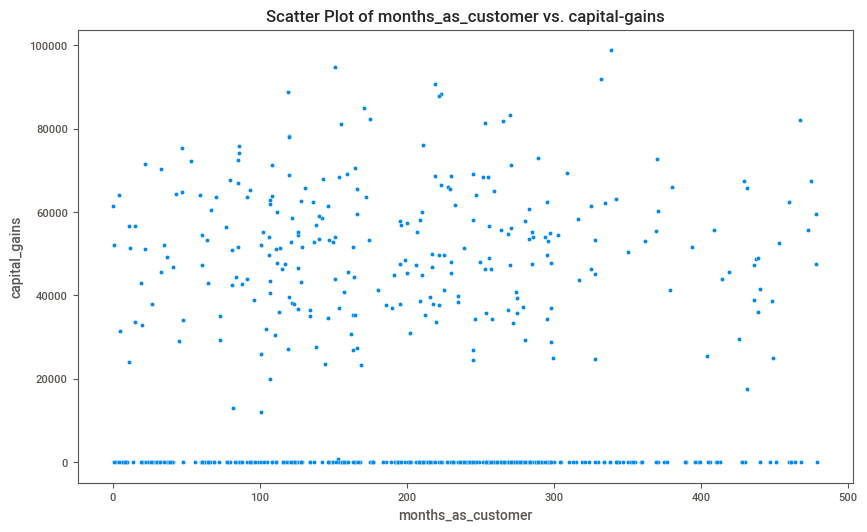

In [132]:
plt.figure(figsize=(10, 6))
sns.scatterplot(x='months_as_customer', y='capital_gains', data=autinsurance)
plt.title("Scatter Plot of months_as_customer vs. capital-gains")
plt.show()

In [133]:
# Calculate mean and standard deviation
mean = autinsurance['months_as_customer'].mean()
std_dev = autinsurance['capital_gains'].std()

# Calculate quartiles and interquartile range
Q1 = autinsurance['months_as_customer'].quantile(0.25)
Q3 = autinsurance['capital_gains'].quantile(0.75)
IQR = Q3 - Q1

# Z-Score
threshold = 2
autinsurance['z_score'] = np.abs((autinsurance['months_as_customer'] - mean) / std_dev)
outliers_zscore = autinsurance[autinsurance['z_score'] > threshold]

In [134]:
from scipy import stats
# Outlier Tests
# Dixon's Q Test
outliers_dixon = autinsurance[(np.abs(autinsurance['months_as_customer'] - autinsurance['months_as_customer'].mean()) > threshold * autinsurance['months_as_customer'].std())]
# Print the detected Outliers
outliers_dixon
# Machine Learning Techniques
# Clustering (K-means)

,months_as_customer,policy_state,policy_csl,policy_deductable,policy_annual_premium,umbrella_limit,insured_sex,insured_education_level,insured_occupation,insured_hobbies,insured_relationship,capital_gains,capital_loss,incident_type,collision_type,incident_severity,authorities_contacted,incident_state,number_of_vehicles_involved,property_damage,bodily_injuries,witnesses,police_report_available,auto_make,auto_model,fraud_reported,z_score
11,447.0,OH,0,2000.0,1137.16,0.0,0,2,3,16,2,0.0,-51000.0,0,1,0,1,4,3.0,2,1.0,2.0,2,1,4,0.0,0.008677
15,473.0,IN,0,2000.0,1131.40,0.0,0,4,13,12,2,55700.0,0.0,0,3,0,3,6,4.0,2,0.0,0.0,1,0,23,1.0,0.009606
20,460.0,IN,1,1000.0,1187.96,4000000.0,1,3,7,3,3,0.0,0.0,0,2,1,4,1,3.0,1,1.0,0.0,0,11,19,0.0,0.009142
56,439.0,IN,1,500.0,1082.49,0.0,0,6,9,5,4,36100.0,-55000.0,0,1,0,1,4,3.0,0,2.0,3.0,0,6,8,0.0,0.008392
67,478.0,OH,1,500.0,835.02,0.0,0,0,0,15,4,59600.0,0.0,0,3,1,1,6,3.0,1,1.0,1.0,1,2,38,0.0,0.009784
106,464.0,OH,2,1000.0,1125.37,0.0,0,0,9,1,0,0.0,-56400.0,0,2,0,4,5,3.0,0,0.0,2.0,2,10,3,1.0,0.009284
111,453.0,IN,0,500.0,1298.91,6000000.0,1,6,2,7,4,52600.0,-38800.0,2,1,0,1,0,1.0,2,0.0,0.0,0,5,14,1.0,0.008892
156,461.0,OH,0,2000.0,1402.75,0.0,1,3,3,8,0,0.0,0.0,0,2,1,4,1,3.0,0,2.0,1.0,2,7,36,0.0,0.009177
190,449.0,OH,1,2000.0,1440.68,0.0,1,0,12,12,3,25000.0,0.0,1,0,1,2,4,1.0,2,0.0,1.0,2,13,28,0.0,0.008749
203,468.0,IL,0,500.0,1011.92,0.0,1,6,6,13,5,0.0,0.0,0,2,0,1,4,3.0,2,0.0,3.0,0,3,34,0.0,0.009427


In [135]:
z_scores = np.abs(stats.zscore(autinsurance['months_as_customer']))
outliers = autinsurance[z_scores > threshold]

# Remove outliers from DataFrame
df_cleaned = autinsurance[z_scores <= threshold]

# Optional: Analyze the modified dataset
print("Original dataset shape:", autinsurance.shape)
print("Cleaned dataset shape:", df_cleaned.shape)


Original dataset shape: (548, 27)
Cleaned dataset shape: (526, 27)


In [136]:
df_cleaned.to_csv("insurance_claimsV4.csv", index = False)

In [137]:
df = pd.read_csv("insurance_claimsV4.csv")

In [138]:
df.shape
def getDataSet():
    return df

In [139]:
df.columns

Index(['months_as_customer', 'policy_state', 'policy_csl', 'policy_deductable',
       'policy_annual_premium', 'umbrella_limit', 'insured_sex',
       'insured_education_level', 'insured_occupation', 'insured_hobbies',
       'insured_relationship', 'capital_gains', 'capital_loss',
       'incident_type', 'collision_type', 'incident_severity',
       'authorities_contacted', 'incident_state',
       'number_of_vehicles_involved', 'property_damage', 'bodily_injuries',
       'witnesses', 'police_report_available', 'auto_make', 'auto_model',
       'fraud_reported', 'z_score'],
      dtype='object')